In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
dataset = pd.read_csv('AB_NYC_2019.csv')
dataset.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [3]:
print('\nRows : ',dataset.shape[0])
print('\nColumns :', dataset.shape[1])
print('\nColumns:',dataset.columns.to_list())
print(' \nUnique:\n',dataset.nunique())


Rows :  48895

Columns : 16

Columns: ['id', 'name', 'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood', 'latitude', 'longitude', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'last_review', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']
 
Unique:
 id                                48895
name                              47905
host_id                           37457
host_name                         11452
neighbourhood_group                   5
neighbourhood                       221
latitude                          19048
longitude                         14718
room_type                             3
price                               674
minimum_nights                      109
number_of_reviews                   394
last_review                        1764
reviews_per_month                   937
calculated_host_listings_count       47
availability_365                    366
dtype: int64


In [4]:
print(dataset['latitude'].mean())
dataset['longitude'].mean()

40.7289488806627


-73.9521696146839

In [51]:
import folium
from folium.plugins import MarkerCluster
from folium import plugins
from folium.plugins import FastMarkerCluster
from folium.plugins import HeatMap
from scipy.stats import pearsonr

In [5]:
dir(MarkerCluster)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_get_self_bounds',
 '_template',
 'add_child',
 'add_children',
 'add_to',
 'get_bounds',
 'get_name',
 'get_root',
 'render',
 'save',
 'to_dict',
 'to_json']

In [50]:
Long=dataset['longitude'].mean()
Lat=dataset['latitude'].mean()
map1 = folium.Map(location=[Lat,Long], zoom_start=9)
map1

In [7]:
locations = list(zip(dataset.latitude, dataset.longitude))
marker_cluster = MarkerCluster(
locations=locations)
marker_cluster.add_to(map1)
map1

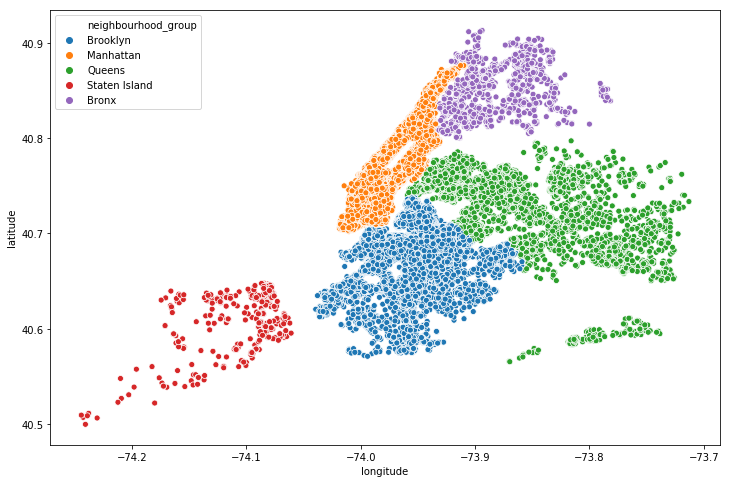

In [8]:
plt.figure(figsize=(12,8))
sns.scatterplot(x=dataset.longitude,y=dataset.latitude,hue=dataset.neighbourhood_group)
plt.show()

In [9]:
dataset.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [10]:
dataset.fillna({'reviews_per_month':0},inplace=True)

In [11]:
dataset.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                     0
calculated_host_listings_count        0
availability_365                      0
dtype: int64

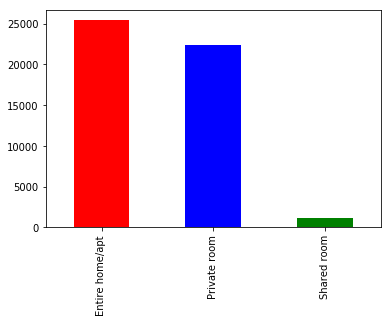

In [12]:
dataset['room_type'].value_counts().plot(kind='bar',color=['r','b','g'])
plt.show()

In [13]:
apt = dataset[dataset['room_type']=='Entire home/apt']
list_apt = apt.groupby(['host_id','host_name','neighbourhood','neighbourhood_group']).size().reset_index(name='apartment').sort_values(by=['apartment'],ascending=False)
list_apt.head(10)

,host_id,host_name,neighbourhood,neighbourhood_group,apartment
20211,219517861,Sonder (NYC),Financial District,Manhattan,210
6449,7503643,Vida,Greenpoint,Brooklyn,52
8430,12243051,Sonder,Financial District,Manhattan,51
20214,219517861,Sonder (NYC),Murray Hill,Manhattan,50
19900,205031545,Red Awning,Midtown,Manhattan,49
17832,120762452,Stanley,Murray Hill,Manhattan,49
12273,30283594,Kara,Hell's Kitchen,Manhattan,41
17451,107434423,Blueground,Chelsea,Manhattan,37
12275,30283594,Kara,Midtown,Manhattan,33
17628,113805886,Yaacov,Upper East Side,Manhattan,33


In [14]:
private = dataset[dataset['room_type']=='Private room']
list_private = private.groupby(['host_id','host_name','neighbourhood']).size().reset_index(name='private').sort_values(by=['private'],ascending=False)
list_private.head(10)

,host_id,host_name,neighbourhood,private
15261,190921808,John,Hell's Kitchen,44
14025,137358866,Kazuya,Woodside,35
16301,238321374,Eyal,Upper West Side,32
15984,224414117,Gabriel,Hell's Kitchen,30
16035,226410657,Nina,Bedford-Stuyvesant,26
16144,230192510,Zach,Fort Greene,25
16386,242962235,Yuval,Ridgewood,23
16539,252604696,Erin,Chelsea,20
15761,216235179,Nina,Bushwick,17
14024,137358866,Kazuya,Sunnyside,17


In [15]:
shared = dataset[dataset['room_type']=='Shared room']
list_shared = private.groupby(['host_id','host_name','neighbourhood']).size().reset_index(name='shared').sort_values(by=['shared'],ascending=False)
list_shared.head(10)

,host_id,host_name,neighbourhood,shared
15261,190921808,John,Hell's Kitchen,44
14025,137358866,Kazuya,Woodside,35
16301,238321374,Eyal,Upper West Side,32
15984,224414117,Gabriel,Hell's Kitchen,30
16035,226410657,Nina,Bedford-Stuyvesant,26
16144,230192510,Zach,Fort Greene,25
16386,242962235,Yuval,Ridgewood,23
16539,252604696,Erin,Chelsea,20
15761,216235179,Nina,Bushwick,17
14024,137358866,Kazuya,Sunnyside,17


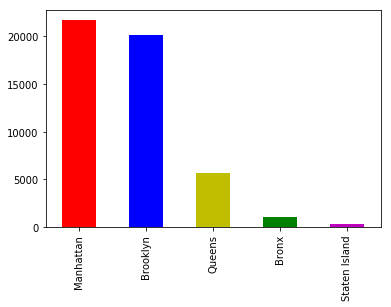

In [16]:
dataset['neighbourhood_group'].value_counts().plot(kind='bar',color=['r','b','y','g','m'])
plt.show()

In [17]:
private = dataset[dataset['neighbourhood_group']=='Manhattan']
list_private = private.groupby(['host_id','host_name','neighbourhood','neighbourhood_group']).size().reset_index(name='count').sort_values(by=['count'],ascending=False)
list_private.head(10)

,host_id,host_name,neighbourhood,neighbourhood_group,count
15621,219517861,Sonder (NYC),Financial District,Manhattan,218
5701,12243051,Sonder,Financial District,Manhattan,51
15624,219517861,Sonder (NYC),Murray Hill,Manhattan,50
13768,120762452,Stanley,Murray Hill,Manhattan,50
15380,205031545,Red Awning,Midtown,Manhattan,49
15150,190921808,John,Hell's Kitchen,Manhattan,46
8892,30283594,Kara,Hell's Kitchen,Manhattan,41
13463,107434423,Blueground,Chelsea,Manhattan,37
13622,113805886,Yaacov,Upper East Side,Manhattan,33
8894,30283594,Kara,Midtown,Manhattan,33


In [18]:
dataset.price.isna().sum()

0

In [19]:
dataset['price'].describe()

count    48895.000000
mean       152.720687
std        240.154170
min          0.000000
25%         69.000000
50%        106.000000
75%        175.000000
max      10000.000000
Name: price, dtype: float64

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


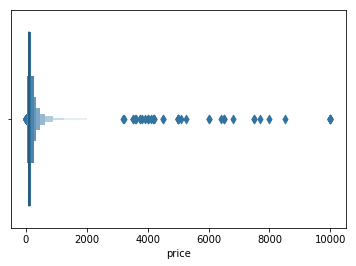

In [20]:
figsize=(16,12)
sns.boxenplot(x='price',data=dataset)

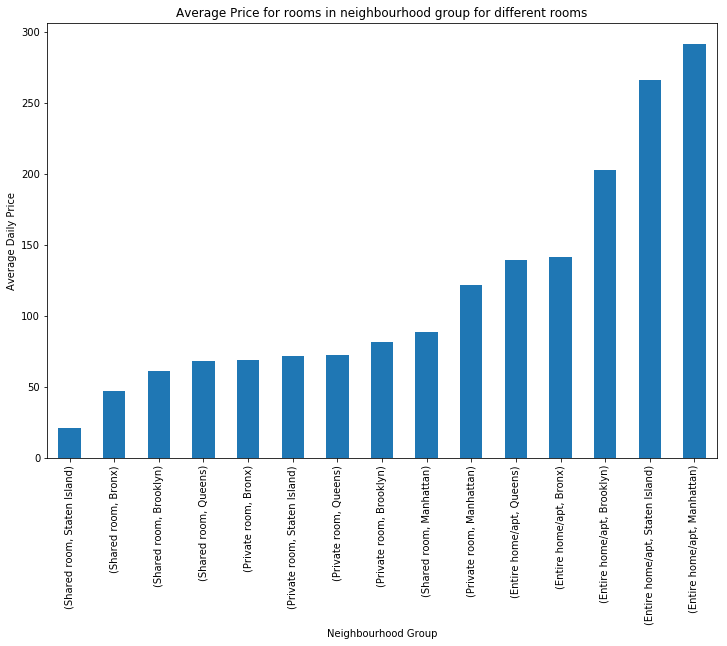

In [48]:
df = dataset[dataset['minimum_nights']==1]
df1 = df.groupby(['room_type','neighbourhood_group'])['price'].mean().sort_values(ascending=True)
plt.figure(figsize=(12,8))
df1.plot(kind='bar')
plt.title('Average Price for rooms in neighbourhood group for different rooms')
plt.ylabel('Average Daily Price')
plt.xlabel('Neighbourhood Group')
plt.show()

In [49]:
print('List of Average Price per night based on the neighbourhood group')
pd.DataFrame(df1).sort_values(by='room_type')

List of Average Price per night based on the neighbourhood group


price
room_type       neighbourhood_group            
Entire home/apt Queens               139.036260
                Bronx                141.541176
                Brooklyn             202.895245
                Staten Island        266.205128
                Manhattan            291.784595
Private room    Bronx                 69.025862
                Staten Island         71.394366
                Queens                72.454958
                Brooklyn              81.713284
                Manhattan            121.434183
Shared room     Staten Island         21.000000
                Bronx                 46.711111
                Brooklyn              60.921212
                Queens                68.459459
                Manhattan             88.462898

In [31]:
df2=dataset.dropna(subset=["price"])
df3=df2.groupby(['neighbourhood'])['price'].mean()
df4=df3.sort_values(ascending=False).head(10)
df4

neighbourhood
Fort Wadsworth       800.000000
Woodrow              700.000000
Tribeca              490.638418
Sea Gate             487.857143
Riverdale            442.090909
Prince's Bay         409.500000
Battery Park City    367.557143
Flatiron District    341.925000
Randall Manor        336.000000
NoHo                 295.717949
Name: price, dtype: float64

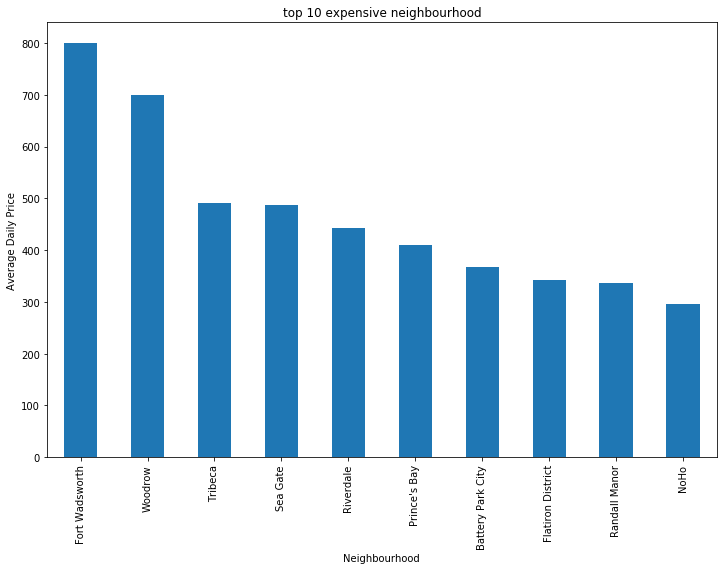

In [39]:
plt.figure(figsize=(12,8))
df4.plot(kind='bar')
plt.title('top 10 expensive neighbourhood')
plt.ylabel('Average Daily Price')
plt.xlabel('Neighbourhood')
plt.show()

In [37]:
df5=dataset.dropna(subset=["price"])
df6=df5.groupby(['neighbourhood'])['price'].mean()
df7=df6.sort_values(ascending=True).head(10)
df7

neighbourhood
Bull's Head       47.333333
Hunts Point       50.500000
Tremont           51.545455
Soundview         53.466667
New Dorp          57.000000
Bronxdale         57.105263
New Dorp Beach    57.400000
Grant City        57.666667
Concord           58.192308
Mount Eden        58.500000
Name: price, dtype: float64

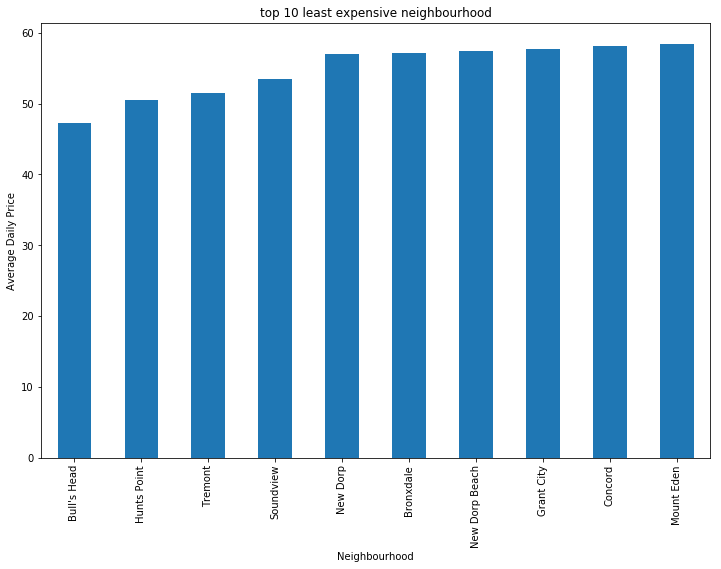

In [40]:
plt.figure(figsize=(12,8))
df7.plot(kind='bar')
plt.title('top 10 least expensive neighbourhood')
plt.ylabel('Average Daily Price')
plt.xlabel('Neighbourhood')
plt.show()

In [45]:
df8=dataset.groupby(['neighbourhood']).size().sort_values(ascending=False)
df9=df8.head(20)
df9

neighbourhood
Williamsburg          3920
Bedford-Stuyvesant    3714
Harlem                2658
Bushwick              2465
Upper West Side       1971
Hell's Kitchen        1958
East Village          1853
Upper East Side       1798
Crown Heights         1564
Midtown               1545
East Harlem           1117
Greenpoint            1115
Chelsea               1113
Lower East Side        911
Astoria                900
Washington Heights     899
West Village           768
Financial District     744
Flatbush               621
Clinton Hill           572
dtype: int64

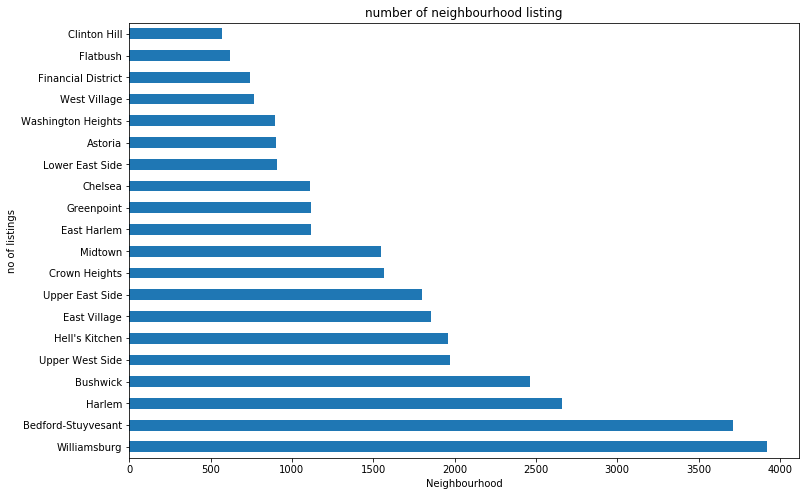

In [47]:
plt.figure(figsize=(12,8))
df9.plot(kind='barh')
plt.title('number of neighbourhood listing')
plt.ylabel('no of listings')
plt.xlabel('Neighbourhood')
plt.show()